In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session
from pathlib import Path
from typing import Optional, Sequence, Tuple

import matplotlib.pyplot as plt
import numpy as np

from PIL import Image
#from IPython.display import display

In [2]:

TRAIN_SPLIT_DIR = Path("/Volumes/ZX20/eliva-26-ink-detection/train")
print("Training split:", TRAIN_SPLIT_DIR)


Training split: /Volumes/ZX20/eliva-26-ink-detection/train


In [3]:
def numeric_slice_key(path: Path):
    return (0, int(path.stem)) if path.stem.isdigit() else (1, path.name)


def first_tiff_path(patch_dir: Path) -> Path:
    tiffs = sorted((patch_dir / "surface_volume").glob("*.tif"), key=numeric_slice_key)
    if not tiffs:
        raise FileNotFoundError(f"No TIFF slices found in {patch_dir / 'surface_volume'}")
    return tiffs[0]

def rle_encode(mask: np.ndarray) -> str:
    pixels = mask.astype(np.uint8).ravel()
    pixels = np.concatenate([[0], pixels, [0]])
    changes = np.where(pixels[1:] != pixels[:-1])[0] + 1
    changes[1::2] -= changes[::2]
    return " ".join(str(x) for x in changes)

def rle_decode(rle: object, shape: Tuple[int, int]) -> np.ndarray:
    """Decode 1-indexed Kaggle-style RLE into a 2D binary mask."""
    flat = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    if rle is None or (isinstance(rle, float) and np.isnan(rle)):
        return flat.reshape(shape)

    rle = str(rle).strip()
    if not rle:
        return flat.reshape(shape)

    values = np.asarray([int(v) for v in rle.split()], dtype=np.int64)
    starts = values[0::2] - 1
    lengths = values[1::2]
    ends = starts + lengths
    for start, end in zip(starts, ends):
        flat[start:end] = 1
    return flat.reshape(shape)


def load_rle_label(patch_dir: Path, shape: Tuple[int, int]) -> np.ndarray:
    rle_path = patch_dir / "inklabels_rle.csv"
    df = pd.read_csv(rle_path)
    if "Predicted" not in df.columns:
        raise ValueError(f"{rle_path} does not contain a Predicted column")
    return rle_decode(df.loc[0, "Predicted"], shape)


def load_patch_triplet(patch_dir: Path):
    mask = np.asarray(Image.open(patch_dir / "mask.png")) > 0
    label = load_rle_label(patch_dir, mask.shape)
    tiff_path = first_tiff_path(patch_dir)
    first_slice = np.asarray(Image.open(tiff_path))
    return label, mask, first_slice, tiff_path

def show_patch_triplet(patch_dir: Path):
    label, mask, first_slice, tiff_path = load_patch_triplet(patch_dir)
    label_display = (label.astype(np.uint8) * 255)
    mask_display = (mask.astype(np.uint8) * 255)
    slice_display = first_slice

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"{patch_dir.name} | first TIFF: {tiff_path.name}")

    axes[0].imshow(label_display, cmap="gray")
    axes[0].set_title("inklabels_rle.csv")

    axes[1].imshow(mask_display, cmap="gray")
    axes[1].set_title("mask.png")

    axes[2].imshow(slice_display, cmap="gray")
    axes[2].set_title("first surface TIFF")

    #for ax in axes:
    #    ax.axis("off")
    plt.tight_layout()
    plt.show()


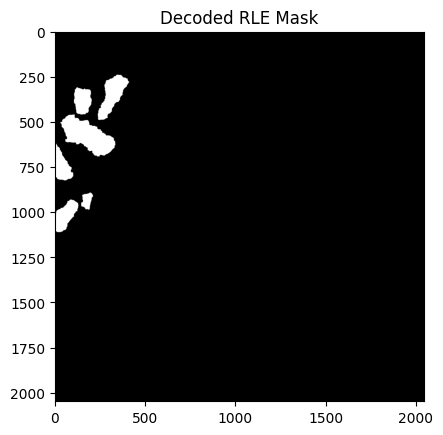

Mask image shape: (2048, 2048)


In [4]:
CSV_MASK_EXAMPLE = "/Volumes/ZX20/eliva-26-ink-detection/train/p_0s2t5eg93al2/inklabels_rle.csv"

mask_df = pd.read_csv(CSV_MASK_EXAMPLE)
mask_rle_string = mask_df.loc[0, "Predicted"]

mask_decoded = rle_decode(mask_rle_string, shape=(2048, 2048))
plt.imshow(mask_decoded, cmap="gray")
plt.title("Decoded RLE Mask")
plt.show() 

# read the mask image
MASK_IMAGE_EXAMPLE = "/Volumes/ZX20/eliva-26-ink-detection/train/p_0s2t5eg93al2/mask.png"
mask_image = Image.open(MASK_IMAGE_EXAMPLE)
mask_array = np.asarray(mask_image)
print("Mask image shape:", mask_array.shape)

Training split: /Volumes/ZX20/eliva-26-ink-detection/train
Num. training patches: 42


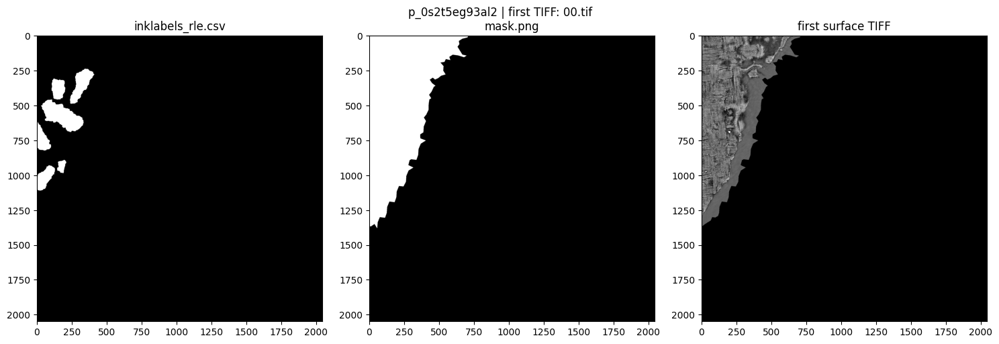

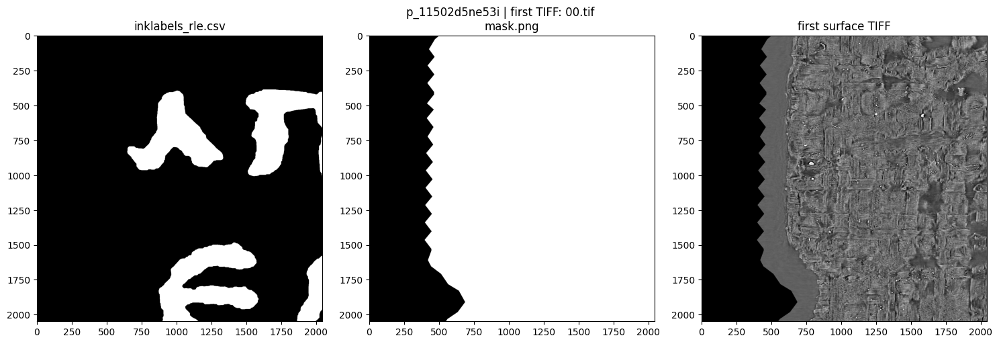

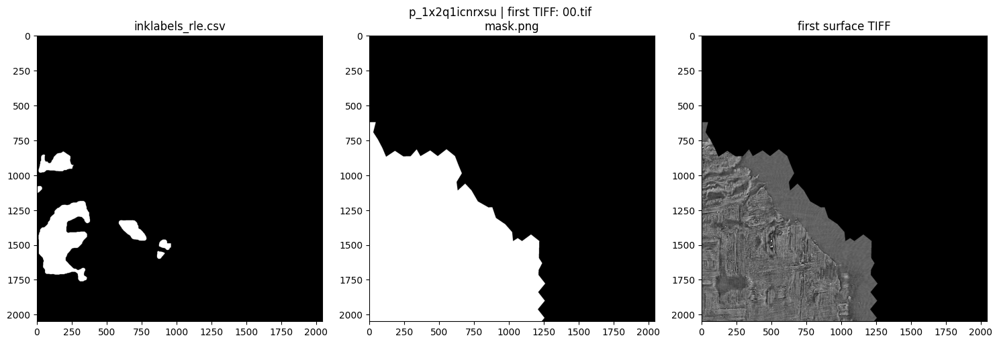

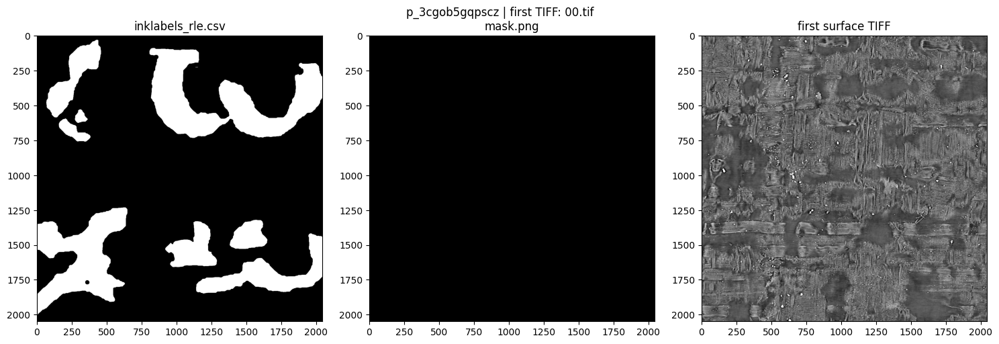

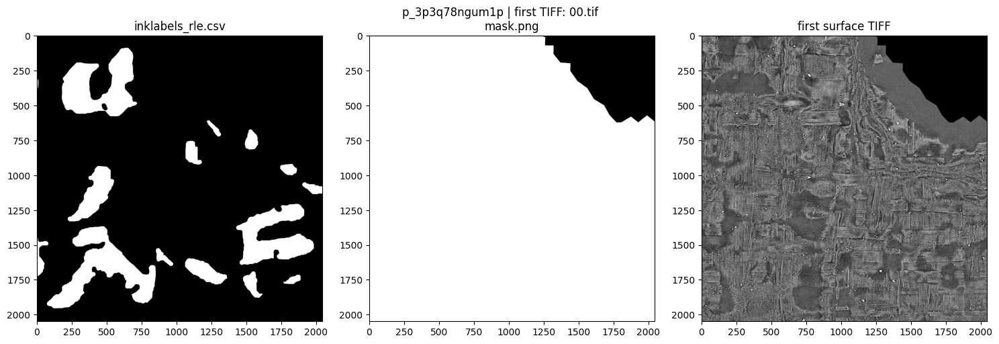

...

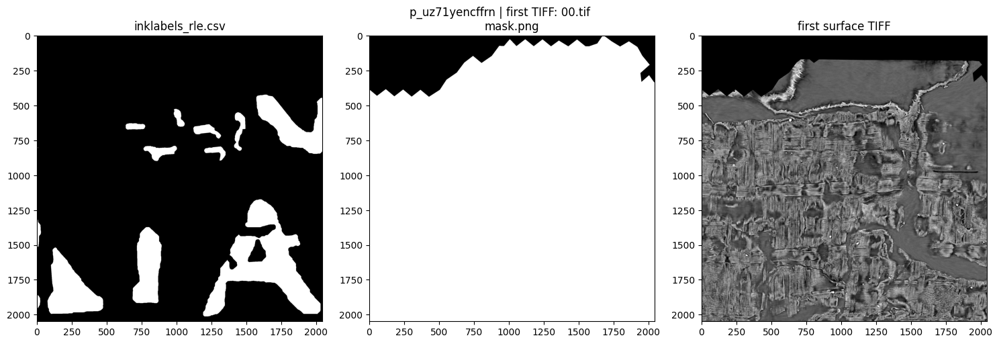

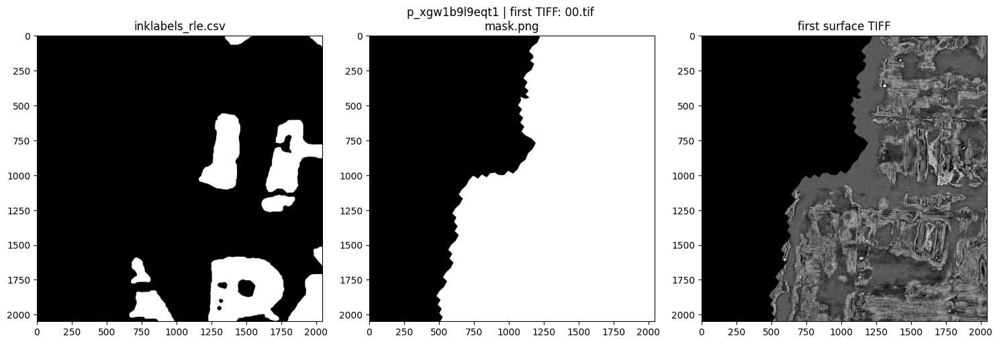

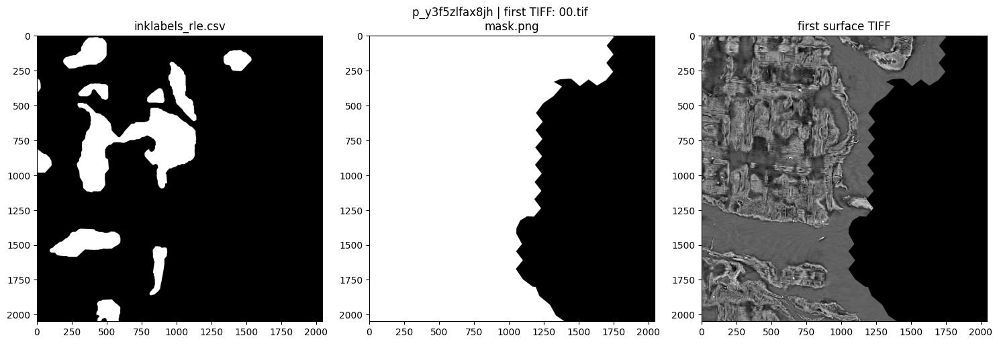

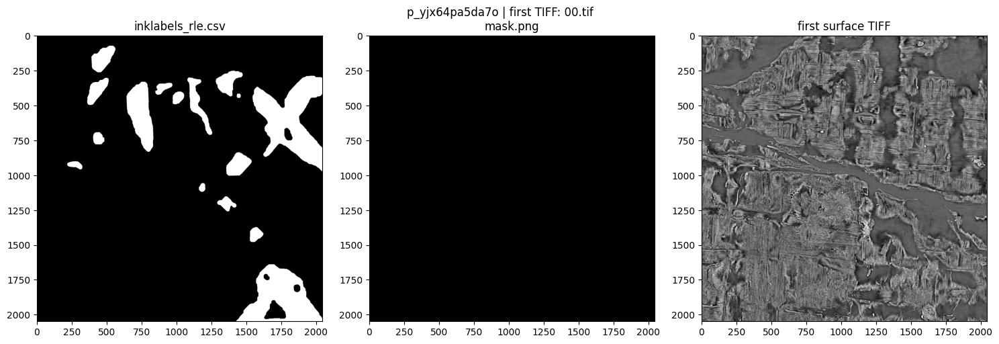

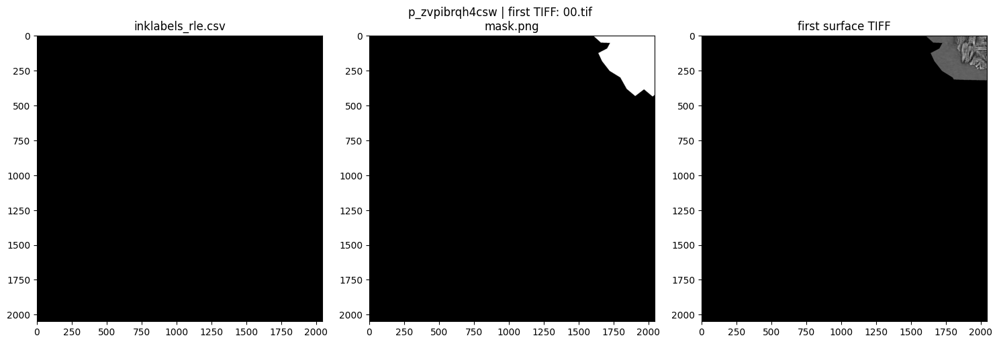

In [5]:
TRAIN_SPLIT_DIR = Path("/Volumes/ZX20/eliva-26-ink-detection/train")
print("Training split:", TRAIN_SPLIT_DIR)
patch_dirs = sorted([p for p in TRAIN_SPLIT_DIR.iterdir() if p.is_dir()])
print("Num. training patches:", len(patch_dirs))


for patch_dir in patch_dirs:
    show_patch_triplet(patch_dir)



Testing split: /Volumes/ZX20/eliva-26-ink-detection/test
Num. testing patches: 16


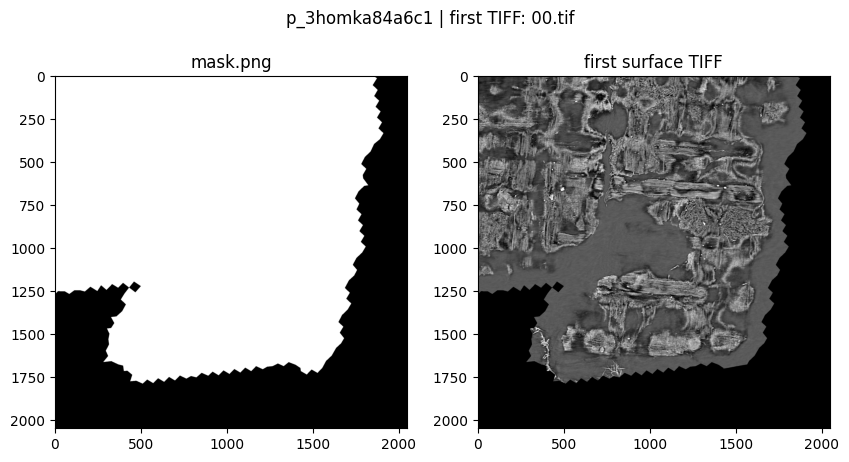

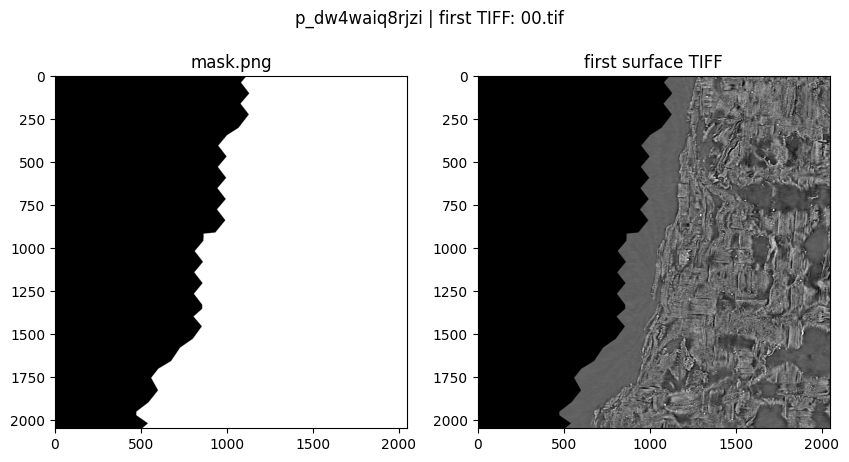

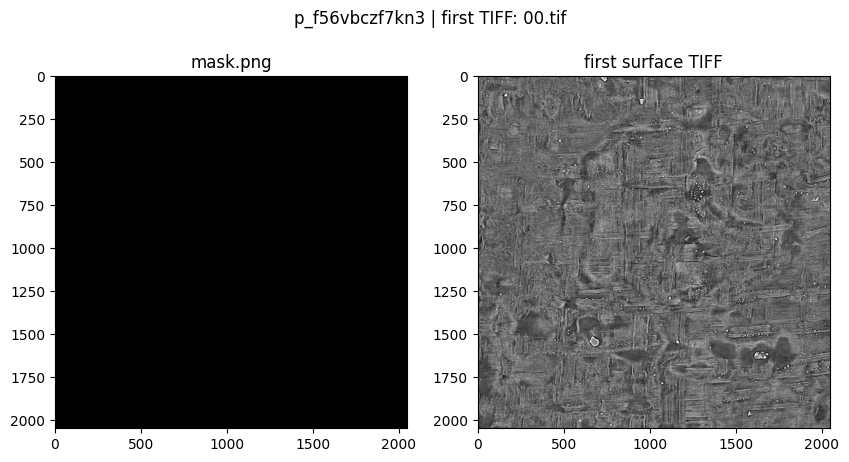

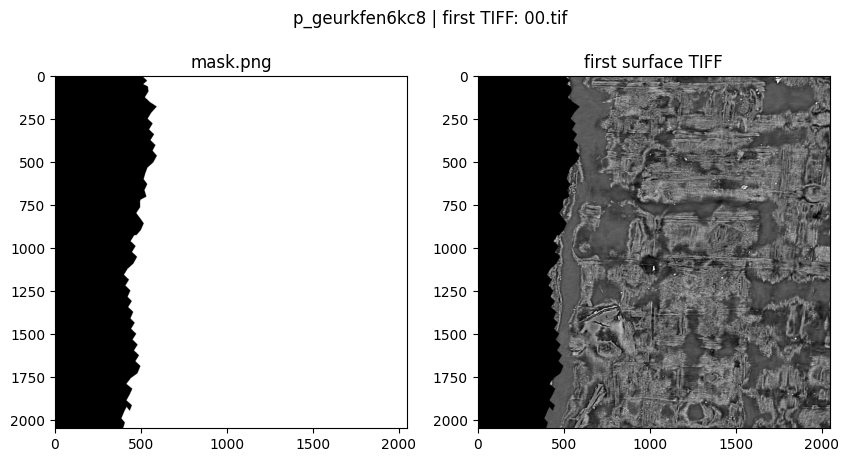

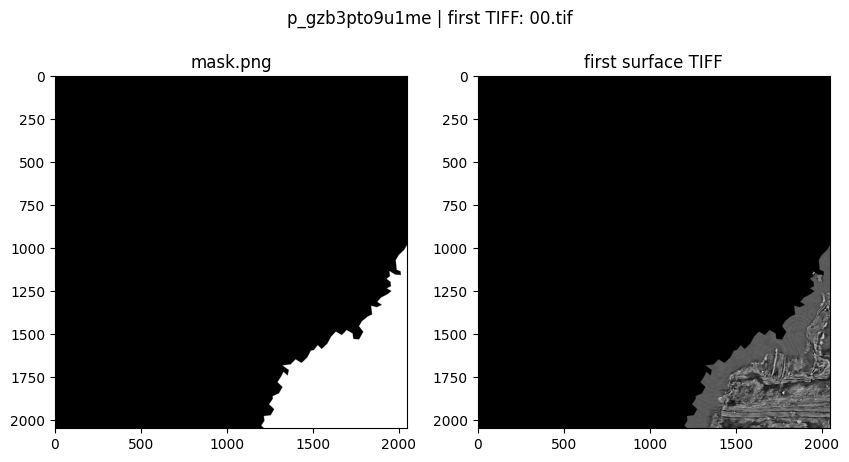

...

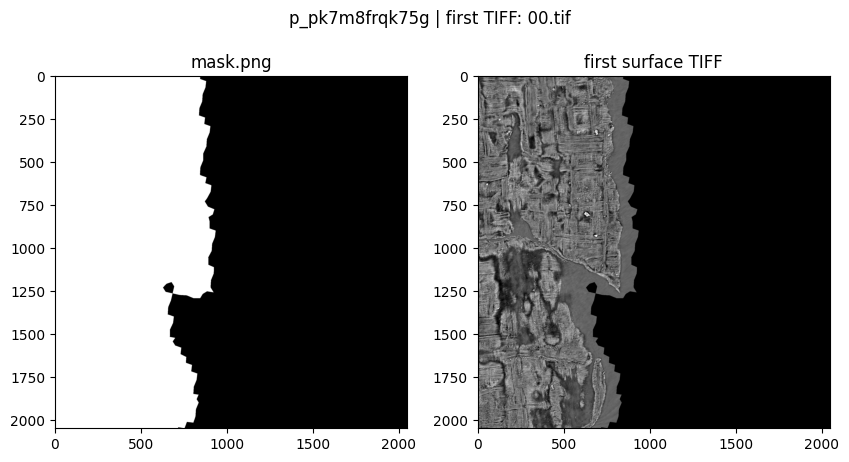

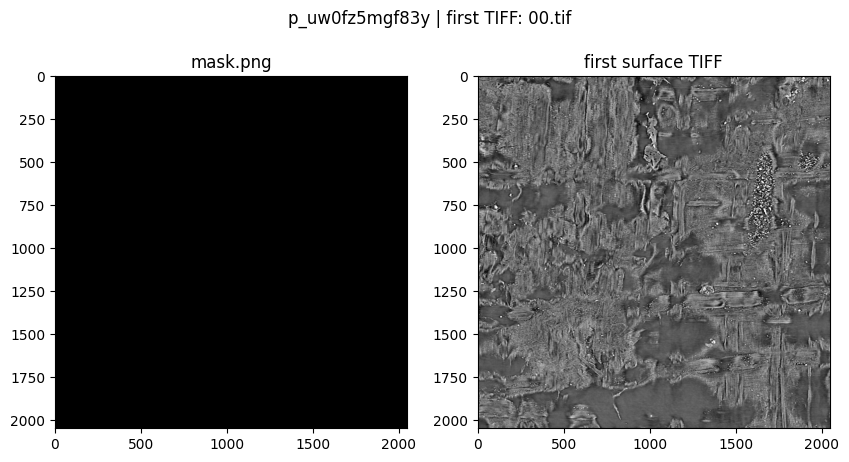

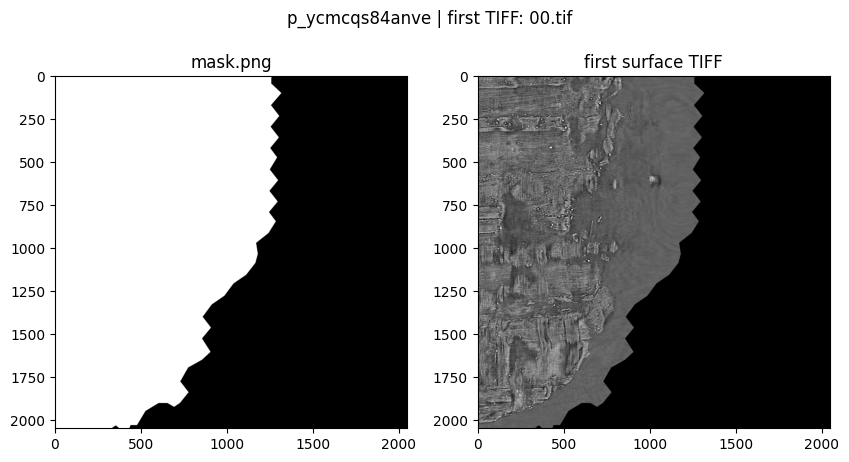

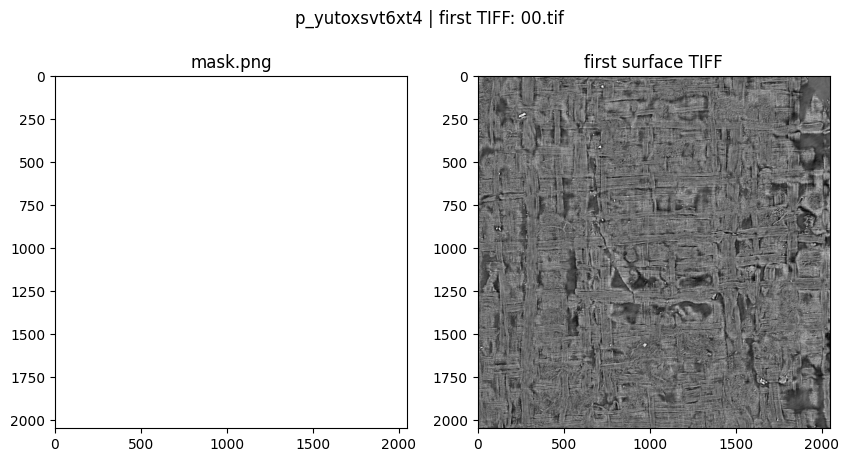

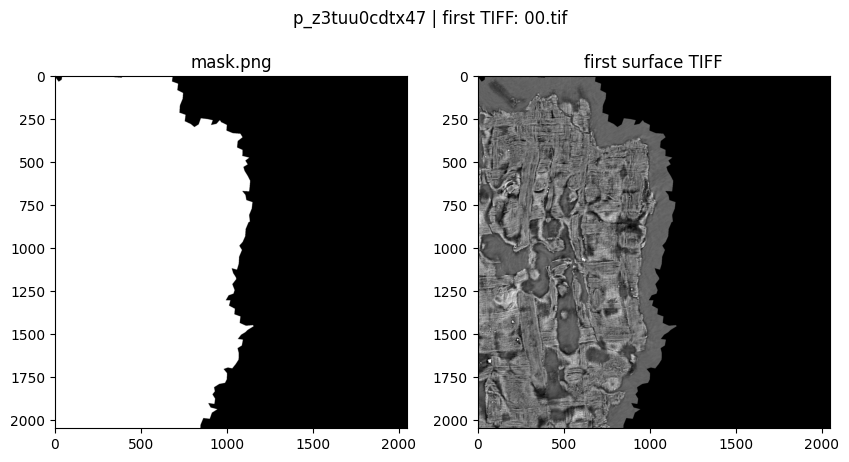

In [6]:
TEST_SPLIT_DIR = Path("/Volumes/ZX20/eliva-26-ink-detection/test")
print("Testing split:", TEST_SPLIT_DIR)
test_patch_dirs = sorted([p for p in TEST_SPLIT_DIR.iterdir() if p.is_dir()])
print("Num. testing patches:", len(test_patch_dirs))

for patch_dir in test_patch_dirs:
    mask = np.asarray(Image.open(patch_dir / "mask.png")) > 0
    tiff_path = first_tiff_path(patch_dir)
    first_slice = np.asarray(Image.open(tiff_path))
    mask_display = (mask.astype(np.uint8) * 255)
    slice_display = first_slice
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(f"{patch_dir.name} | first TIFF: {tiff_path.name}")

    axes[0].imshow(mask_display, cmap="gray")
    axes[0].set_title("mask.png")

    axes[1].imshow(first_slice, cmap="gray")
    axes[1].set_title("first surface TIFF")